In [1]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA 
from sklearn.model_selection import train_test_split, cross_validate, cross_val_score, RandomizedSearchCV, GridSearchCV
from sklearn.metrics import mean_squared_error, r2_score
from sklearn.linear_model import LinearRegression
from sklearn.neighbors import KNeighborsRegressor
from sklearn.ensemble import RandomForestRegressor, AdaBoostRegressor
from sklearn.svm import SVR
from sklearn.base import clone
from xgboost import XGBRegressor
from tqdm import tqdm
from matplotlib.legend import _get_legend_handles_labels


In [2]:
# Setup plt configurations
plt.rcParams.update({'figure.figsize': (5.0, 5.0)})
plt.rcParams.update({'font.size': 14})
plt.rcParams['figure.dpi'] = 600
sns.set_theme(style="ticks", palette="tab10")


In [3]:
df = pd.read_csv('curated-solubility-dataset-2.csv')
df_dropped = df.drop(['ID', 'Name', 'InChI', 'InChIKey','SMILES', 'SD', 'Ocurrences', 'Group'], axis =1)
df_dropped.head()

,Solubility,MolWt,MolLogP,MolMR,HeavyAtomCount,NumHAcceptors,NumHDonors,NumHeteroatoms,NumRotatableBonds,NumValenceElectrons,NumAromaticRings,NumSaturatedRings,NumAliphaticRings,RingCount,TPSA,LabuteASA,BalabanJ,BertzCT
0,-1.942822,613.649,0.82502,151.6811,42.0,9.0,2.0,13.0,7.0,210.0,4.0,0.0,1.0,5.0,166.77,265.197007,4.049990e-06,1942.668338
1,0.661069,152.112,-3.69740,11.0620,8.0,2.0,0.0,6.0,0.0,42.0,0.0,0.0,0.0,0.0,40.13,85.479120,0.000000e+00,87.774438
2,0.684401,143.949,-7.20740,8.7145,7.0,3.0,0.0,7.0,0.0,32.0,0.0,0.0,0.0,0.0,63.19,84.540392,-8.000000e-08,59.070496
3,1.175855,46.025,-0.29920,8.6928,3.0,1.0,1.0,2.0,0.0,18.0,0.0,0.0,0.0,0.0,37.30,17.695007,2.187496e+00,10.264663
4,0.322699,326.306,-3.98820,70.1352,22.0,8.0,4.0,12.0,11.0,130.0,0.0,0.0,0.0,0.0,234.34,125.637922,-1.804999e-06,321.122815


In [4]:
X = df_dropped.drop(['Solubility'], axis = 1)
Y = df_dropped['Solubility']

# Data inspection

The following cell is used to plot the distribution of Lipinski's variablues including Molecular weight; Number of hydrogen bond acceptors; Number of hydrogen bond donors; MlogP

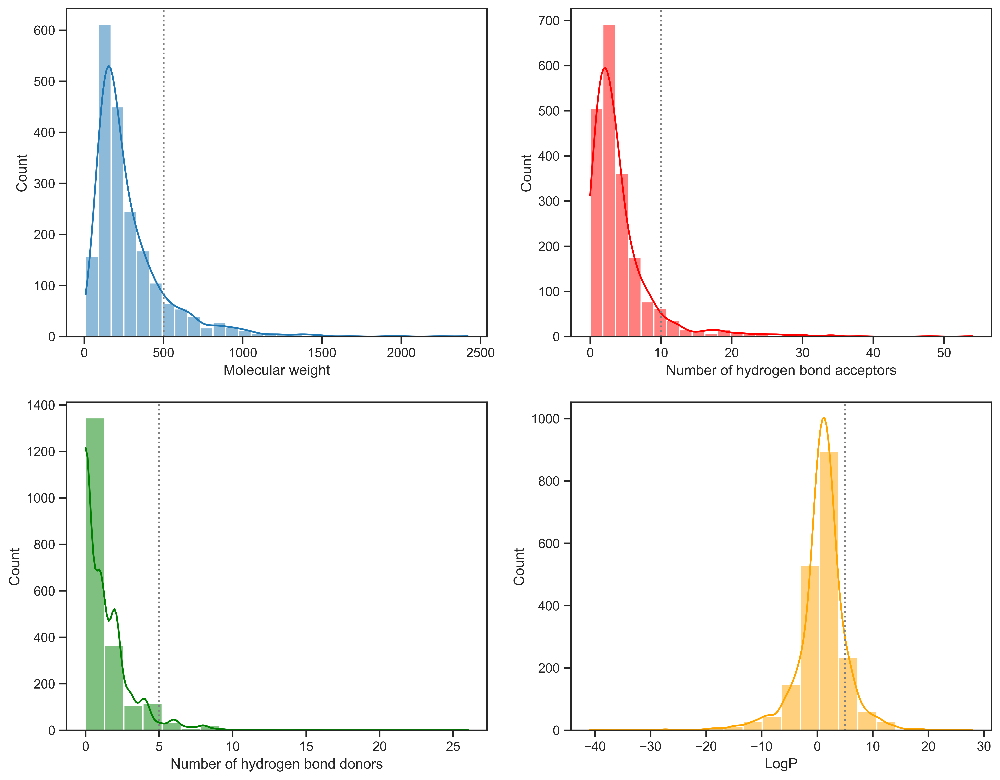

In [5]:
fig, axes = plt.subplots(nrows=2, ncols=2, figsize=(14, 11))

sns.histplot(data = X, x = 'MolWt', kde=True, bins=30, stat = 'count', ax=axes[0,0])
axes[0, 0].set_xlabel('Molecular weight')
axes[0, 0].axvline(x=500, linestyle = ':', color = 'grey')

sns.histplot(data = X, x = 'NumHAcceptors', kde=True, bins=30, stat = 'count', ax=axes[0,1], color='red')
axes[0, 1].set_xlabel('Number of hydrogen bond acceptors')
axes[0, 1].axvline(x=10,  linestyle = ':', color = 'grey')

sns.histplot(data = X, x = 'NumHDonors', kde=True, bins=20, stat = 'count', ax=axes[1,0], color='green')
axes[1, 0].set_xlabel('Number of hydrogen bond donors')
axes[1, 0].axvline(x=5, linestyle = ':', color = 'grey')

sns.histplot(data = X, x = 'MolLogP', kde=True, bins=20, stat = 'count', ax=axes[1,1], color='orange')
axes[1, 1].set_xlabel('LogP')
axes[1, 1].axvline(5, linestyle = ':', color = 'grey')

This can plot the correlation and distribution of them at the same time using seaborn.pairplot

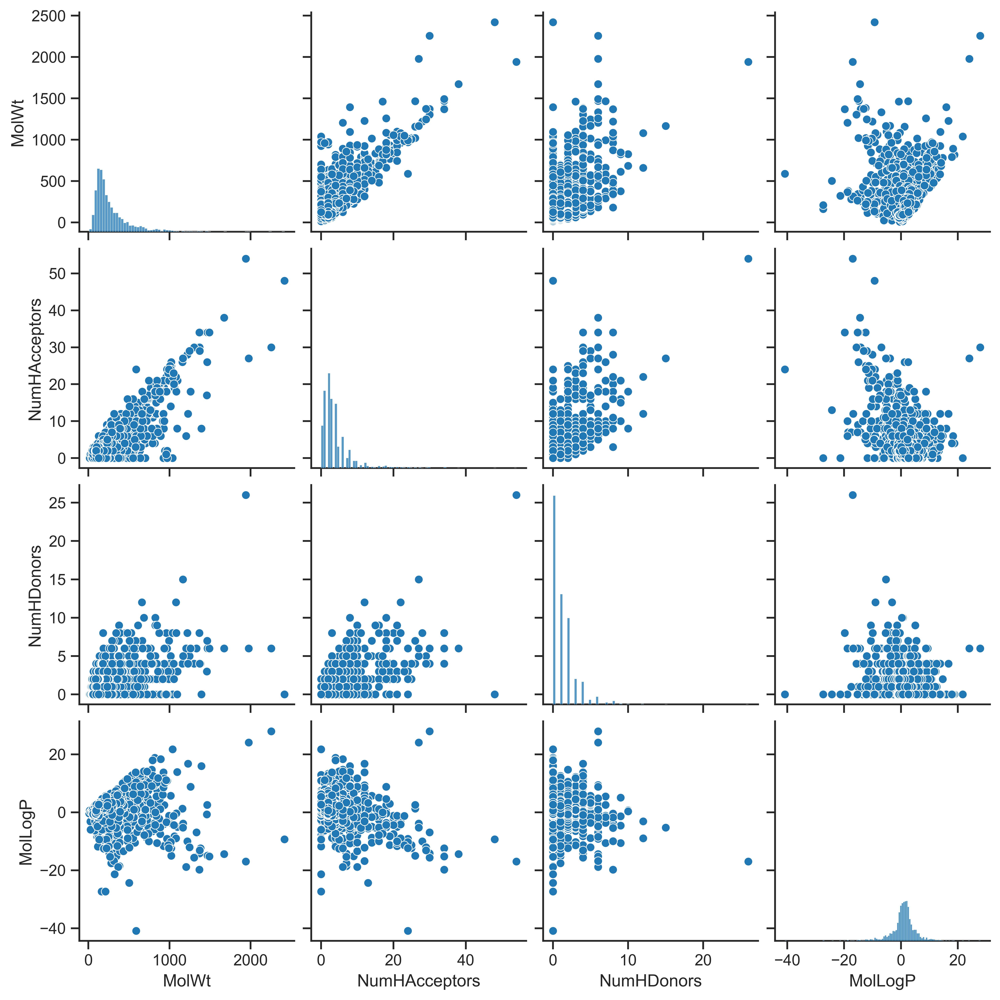

In [6]:
sns.pairplot(X[['MolWt','NumHAcceptors','NumHDonors','MolLogP']])

# Data normalization

Normalization is conducted using the StandardScaler() of sklearn.

In [8]:
scaler = StandardScaler()
X_std = scaler.fit_transform(X)

# Check cross-correlation of variables to reduce redundant variables

First I will check the cross-correlation between variables (features) to eliminate redundant ones. This is done by the DataFrame.corr() method in the second line below, which was then visuallized by sns.heatmap.

<Axes: >

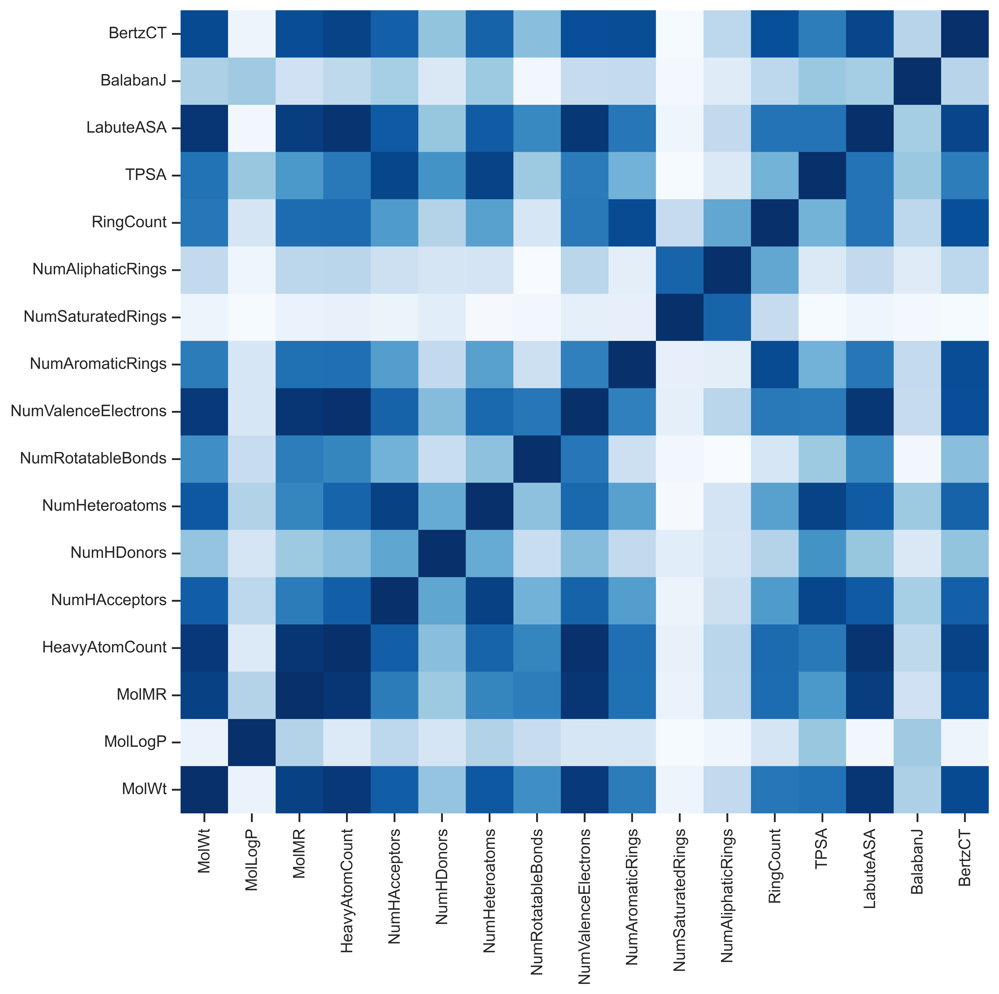

In [9]:
plt.rcParams['figure.figsize']= (10.0, 10.0)
X_std_df = pd.DataFrame(X_std, columns = X.columns)
corr_matrix = X_std_df.corr().abs()
sns.heatmap(corr_matrix[::-1], cmap="Blues",  annot_kws={'fontsize':7}, cbar=False)

Among 17 initial variables, 4 are found to be highly correlated to the others (assuming cut-off = 0.95). I will then eliminate them by a function called **correlation(DataFrame, threshold)** below:

Briefly describe, the function will take the "df" as input and calculate the cross-correlation matrix (stored as "corr_matrix") between the columns in "df". If there are any pairs of column that are higher than "threshold", the function will remove the first column (column[i] or colname variable) in the "df". The output is df and the corresponding corr_matrix.

In [10]:
def correlation(df, threshold):
    df=df.copy()
    col_corr = set() # Set of all the names of deleted columns
    corr_matrix = df.corr().abs()
    for i in range(len(corr_matrix.columns)):
        for j in range(i):
            if corr_matrix.iloc[i, j] >= threshold:
                colname = corr_matrix.columns[i] # getting the name of column
                col_corr.add(colname)
                if colname in df.columns:
                    del df[colname]
    corr_matrix=df.corr().abs()
    new_columns=df.columns
    return df, corr_matrix

The following cell will call the **correlation()** function to eliminate redundant variables, with the second line being called to visuallized the heatmap. This resulted in only 14 variables being kept after the cross-correlation check.

<Axes: >

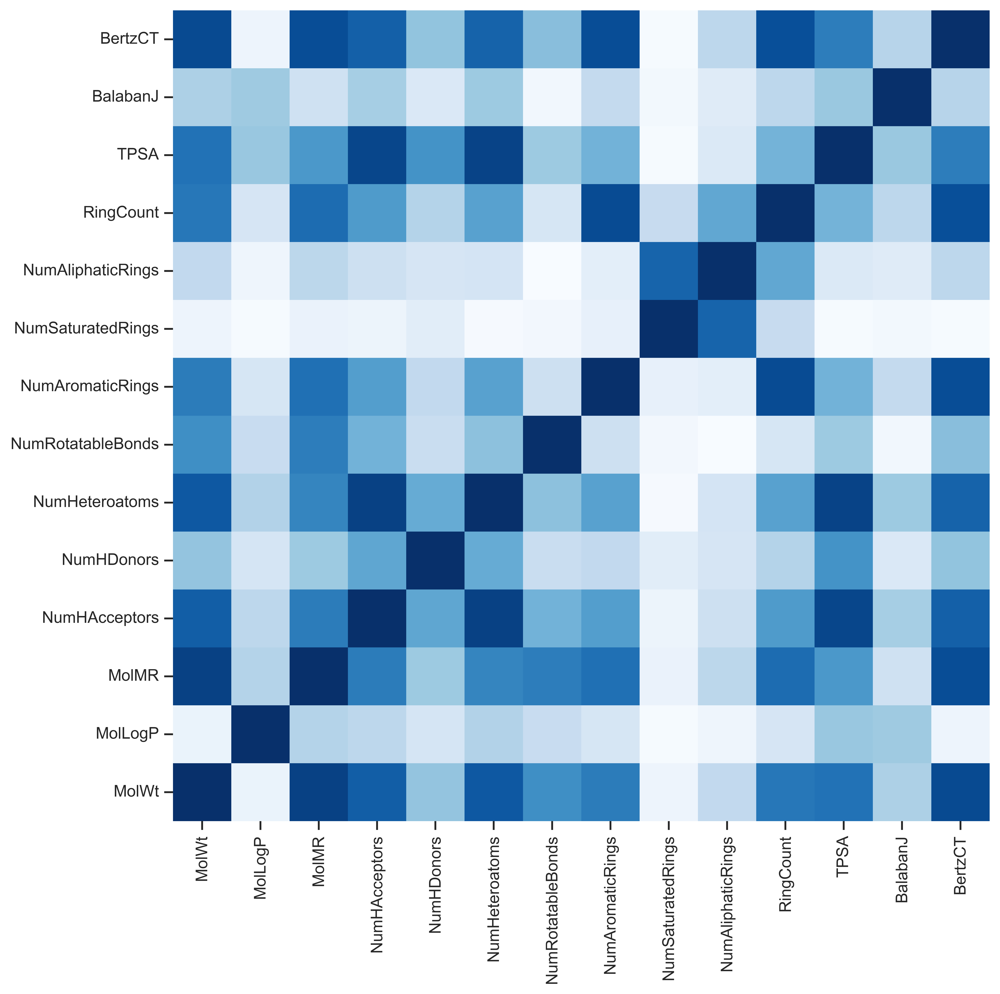

In [12]:
plt.rcParams['figure.figsize']= (10.0, 10.0)
X_clean, corr_mtx_cleaned = correlation(X_std_df, 0.95)
sns.heatmap(corr_mtx_cleaned[::-1], cmap="Blues",  cbar=False, cbar_kws={'orientation':'horizontal'})


# Data splitting

Then, I will split the dataset to two different datasets. The *random_state = 42* was used for reproducibility purposes.

In [13]:
X_train, X_test, y_train, y_test = train_test_split(X_clean, Y, train_size=0.8, random_state=42)

As the following cell, you may see there are two different methods with PCA, which are: fit_transform() and transform(). First the pca variable (a PCA object) is "fit" (learned) on the data of *X_train* and then will "transform" (process/transform) the data of X_train itself to X_train_pca.

Then, the pca variable knows that which dimensions are important, they will only need to transform the X_test again without learning from X_test. Otherwise, it may lead to data leakage (the data from test may be used in the subsequent learning processes). You might want to search for it on the internet.

In [62]:
pca = PCA(n_components=2)
pca.fit(X_clean)
X_train_pca = pca.transform(X_train)
X_test_pca = pca.transform(X_test)

Plot the distribution of training dataset and testing dataset to see if they are on the same "distribution" or not. This can also be used for **Applicability domain** (the domain in which the model is reliable)

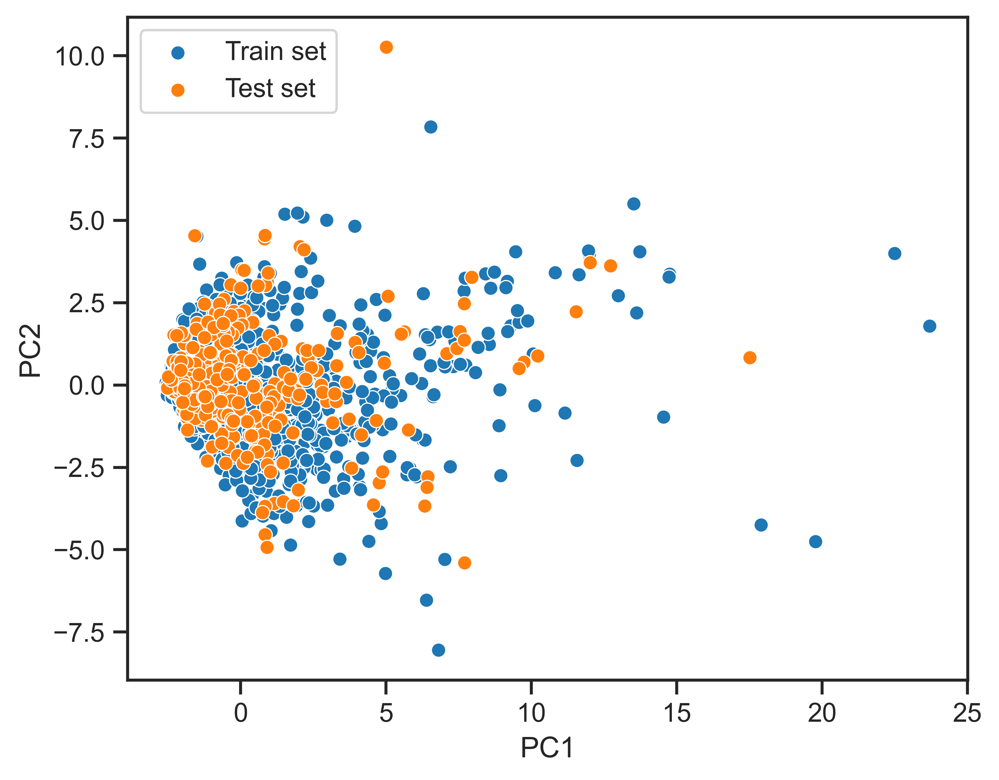

In [80]:
plt.rcParams['figure.figsize']= (6.3, 5.0)
sns.scatterplot(x=X_train_pca[:,0],y=X_train_pca[:,1], c = '#1f77b4', label = 'Train set')
sns.scatterplot(x=X_test_pca[:,0],y=X_test_pca[:,1], c = '#ff7f0e', label = 'Test set')
plt.legend(loc= 'upper left')
plt.xlabel('PC1')
plt.ylabel('PC2')
plt.show()

Plotting distribution of y_train and y_test

This plot to check if the y variables (LogS) of train and test come from the same distribution as observed in the initial dataset or not

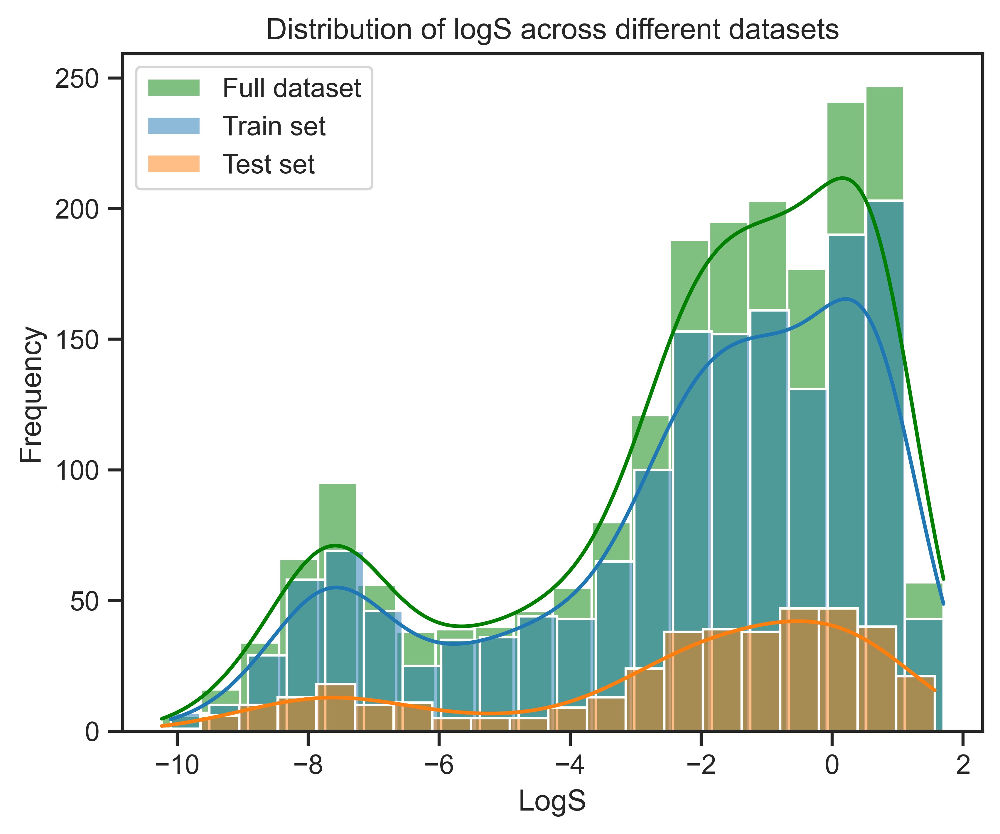

In [68]:
plt.rcParams['figure.figsize']= (6.3, 5.0)
# Plot histogram for full dataset
sns.histplot(Y, kde=True, color='Green', label='Full dataset', bins=20)

# Plot histogram for y_train
sns.histplot(y_train, kde=True, color='#1f77b4', label='Train set', bins=20)

# Plot histogram for y_test
sns.histplot(y_test, kde=True, color='#ff7f0e', label='Test set', bins=20)

# Set plot labels and title
plt.title('Distribution of logS across different datasets')
plt.xlabel('LogS')
plt.ylabel('Frequency')

# Add a legend
plt.legend()

# Show the plot
plt.show()

# Define different models

Herewith, I will define different model; including SVMRegressor; RandomForest; XGBoost; LinearRegressor; KNeighborRegressors; and the param_grids, which are used for **"Hyperparameter tuning"**. I will describe the concept of hyperparameter tuning in few paragraphs.

## Hyperparameter tuning
In the context of machine learning algorithms, a hyperparameter is a configuration that is external to the model and whose value cannot be estimated from the data. Unlike model parameters, which are learned during the training process, hyperparameters are set before the training begins and influence the overall behavior of the model.

Some common hyperparameters like: the number of trees, the number of leaves in the RandomForest/DecisionTree;the number of neighbors in KNN; the kernel of SVM. Although in most cases, the default values of these hyperparameters are sufficient for a reasonably good result, we can "tune" them/test for these combinations to know which are the best models for our datasets.

In this project, I used the GridSearchCV() function of sklearn to test all possible combinations of hyperparameters. For example, for the RandomForest, I will test 504 models (4 n_estimators × 7 max_depth × 3 min_samples_split × 3 min_samples_leaf × 2 boot_strap models = 504 models) of RF. The evaluation is done by CV = 10, meaning that the "train" data will be splitted to five smaller parts, and then the Sklearn will train and evaluate 10 times in each model/combination. The model which resulted in the lowest "mean neg_mean_squared_error" will be chosen as the best combination.
For further description, I refer you to read this document: https://www.mygreatlearning.com/blog/gridsearchcv/

In [71]:
models = {
    'SVM': SVR(),
    'RandomForest': RandomForestRegressor(random_state = 42),
    'XGBoost': XGBRegressor(random_state = 42),
    'LinearRegression': LinearRegression(),
    'KNeighborsRegressor': KNeighborsRegressor()
}

param_grids = {
    'SVM': {
        'C': np.logspace(-3, 3, 7),
        'kernel': ['linear', 'rbf'],
        'gamma': np.logspace(-3, 3, 7)
    },
    'RandomForest': {
        'n_estimators': [50, 100, 150, 200],
        'max_depth': [None] + [int(x) for x in np.linspace(5, 30, 6)],
        'min_samples_split': [2, 5, 10],
        'min_samples_leaf': [1, 2, 4],
        'bootstrap': [True, False]
    },
    'XGBoost': {
        'learning_rate': [0.01, 0.1, 0.2, 0.3],
        'max_depth': [3, 4, 5, 6, 8, 10],
        'subsample': [0.8, 0.9, 1.0],
        'colsample_bytree': [0.8, 0.9, 1.0],
        'n_estimators': [100, 200, 300, 400]
    },
    'LinearRegression': {},
    'KNeighborsRegressor':{
        'n_neighbors': [3, 5, 7, 10],
        'weights': ['uniform', 'distance'],
        'p': [1, 2]  # 1 for Manhattan distance, 2 for Euclidean distance
    }
}


In the following cell, I want to check if the dimensional reduction affect the performance of the models or not. Therefore, I tested different target variables (2, 3, 5, 7, 11) as compared to the reduced dataset (14 variables). If dimension = 14, no PCA was performed.

In the internal loop, I tested different models and used GridSearchCV to tune hyperparameters. 

The following dataframes are used for storing the learning process:

- {df_metrics}: store the evaluation metric of combination of models and features on the go

- {full_prediction}: store the predicted results from the corresponding model and features.

- {full_cvs}: store the RMSE values produced by the best combination of model and features.

In [17]:
target_dimensions = [2, 3, 5, 7, 11, 14]
df_metrics = pd.DataFrame(columns = ['Model','No. of features','RMSE_train','RMSE_test','R2_train','R2_test'])
full_predictions = pd.DataFrame(columns=['Model','No. of features', 'Predicted solubility', 'True solubility'])
full_cvs = pd.DataFrame(columns=['Model','No. of features', 'RMSE'])
for dimension in tqdm(target_dimensions):
    if (dimension == len(X_train.columns)):
        X_train_PCA = X_train
        X_test_PCA = X_test
    else:
        pca = PCA(n_components=dimension)
        X_train_PCA = pca.fit_transform(X_train)
        X_test_PCA = pca.transform(X_test)

    for (model_name, model) in tqdm(models.items()):
        param_grid = param_grids[model_name]
        reg = GridSearchCV(model, param_grid= param_grid, n_jobs=-2, 
                                scoring='neg_mean_squared_error', cv = 10)
        reg.fit(X_train_PCA, y_train)
        
        cv_df = pd.DataFrame({'k':np.arange(0,10)})
        cv_df['Model'] = model_name
        cv_df['No. of features'] = dimension
        cv_df['RMSE'] = cross_val_score(reg.best_estimator_, X_train, y_train, cv=10,
                          scoring='neg_mean_squared_error', n_jobs=-2)                      
        full_cvs = pd.concat([full_cvs, cv_df], axis = 0)

        y_train_pred = reg.predict(X_train_PCA)
        y_pred = reg.predict(X_test_PCA)
        metric_array = [model_name, dimension, 
                        mean_squared_error(y_train, y_train_pred)**(1/2),
                        mean_squared_error(y_test, y_pred)**(1/2), 
                        r2_score(y_train, y_train_pred),
                        r2_score(y_test, y_pred)]
        df_metrics.loc[len(df_metrics.index)] = metric_array
        
        predict_df = pd.DataFrame({'True solubility':y_test}).reset_index(drop=True)
        predict_df['Predicted solubility'] = y_pred
        predict_df['Model'] = model_name
        predict_df['No. of features'] = dimension
        predict_df = predict_df[['Model','No. of features', 'Predicted solubility', 'True solubility']]
        full_predictions = pd.concat([full_predictions, predict_df], axis = 0)

100%|██████████| 6/6 [4:10:10<00:00, 2501.77s/it]  


Stored as csv files for later visuallization if needed

In [18]:
full_predictions
full_predictions.to_csv('Full_predictions.csv', index=False)

In [19]:
df_metrics
df_metrics.to_csv('Metrics.csv',index=False)

In [ ]:
full_cvs['RMSE'] = (-full_cvs['RMSE'])**(1/2)
full_cvs.drop('k', axis=1, inplace=True)
full_cvs.to_csv('Full_CVs.csv', index=False)

(This is as a checkpoint)

In [37]:
full_predictions = pd.read_csv('Full_predictions.csv', index_col=None)
df_metrics = pd.read_csv('Metrics.csv', index_col=None)
full_cvs = pd.read_csv('Full_CVs.csv', index_col=None)

Here I visualized the evaluation metrics across different combination of number of dimensions and models. On the top left is the RMSE on the CVs during training process. As can be seen in the figures, the higher the dimensions, the higher the performance of the models is. Therefore, I chose the original dimension (14 after cross-correlated eliminated) to be used for further analysis. And the RandomForest model was used for further analysis due to their high performance on the $R^2$ on train and test set.
Some other highlights:
- KNN seems to overfit from 2 to 14 dimensions, as implied from the RMSE = 0 and $R^2$ of 1 on train test while performed worse on the external test set.
- LinearRegressor performed equally across different dimensions and are the worst among all the models.
- SVM increased its performance along the number of dimensions but not as good as ensemble models (XGBoost or RF)
- XGBoost also exerted as a good model, with more stable RMSE on CV set, and as well as RF in the $R^2$ metric.

- The increase of dimension at this case doesn't prone to overfit the model. Therefore, the original dimension was used.

C:\Users\Lenovo\AppData\Local\Temp\ipykernel_29900\3140317046.py:9: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  axes[0, 0].set_xticklabels(['SVM', 'RF', 'XGBoost', 'LR', 'KNR'])


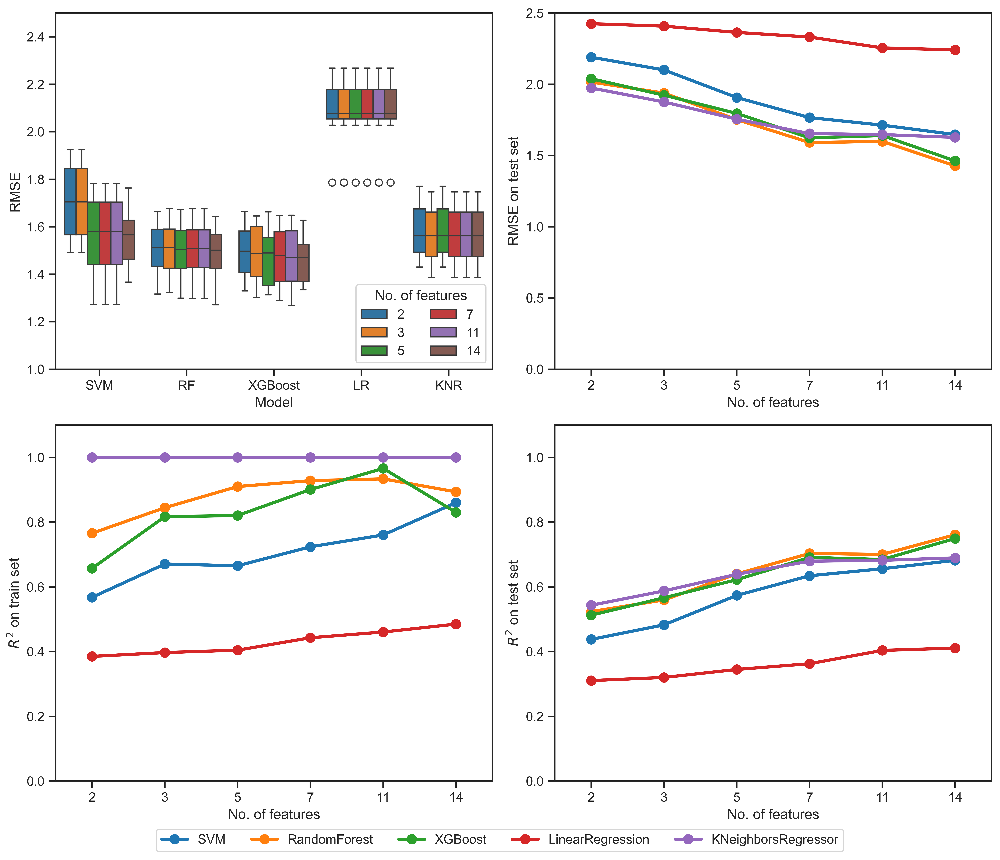

In [171]:
# Create a 2x2 matrix of subplots
fig, axes = plt.subplots(nrows=2, ncols=2, figsize=(12, 10))

# Plot RMSE_train
sns.boxplot(data=full_cvs, x='Model', y='RMSE', hue='No. of features', palette='tab10', ax=axes[0,0],
legend = True)
#axes[0, 0].set_title('RMSE of CVs across different number of dimensions')
axes[0, 0].set_ylim(1, 2.5)
axes[0, 0].set_xticklabels(['SVM', 'RF', 'XGBoost', 'LR', 'KNR'])
axes[0, 0].legend(loc=4, ncol=2, title = 'No. of features')

# Plot RMSE_test
sns.pointplot(data=df_metrics, x='No. of features', y='RMSE_test', hue='Model', ax=axes[0, 1], legend=True)
#axes[0, 1].set_title('RMSE on test set')
axes[0, 1].set_ylabel('RMSE on test set')
axes[0, 1].set_ylim(0, 2.5)

# Plot R2_train
sns.pointplot(data=df_metrics, x='No. of features', y='R2_train', hue='Model', ax=axes[1, 0], legend=True)
#axes[1, 0].set_title('$R^2$ on train set')
axes[1, 0].set_ylabel('$R^2$ on train set')
axes[1, 0].set_ylim(0, 1.1)

# Plot R2_test
sns.pointplot(data=df_metrics, x='No. of features', y='R2_test', hue='Model', ax=axes[1, 1], legend=True)
#axes[1, 1].set_title('$R^2$ on test set')
axes[1, 1].set_ylabel('$R^2$ on test set')
axes[1, 1].set_ylim(0, 1.1)

# Adjust layout
plt.tight_layout()

# Hide individual legends inside the subplots
for i,ax in enumerate(axes.flat):
    if i==0: continue
    ax.get_legend().set_visible(False)

# Create a common legend outside the subplots
handles, labels = axes[1, 1].get_legend_handles_labels()
fig.legend(handles, labels, loc='lower center', ncol=5, bbox_to_anchor=(0.5, -0.025), 
           fontsize = 11)

# Show the plot
plt.show()


# Focus on RF model

**RandomForest** and the original set of variables were chosen for further analysis as they resulted in the best performance (i.e. lowest RMSE on test set and highest $R^2$ on external test set)

(Here need to retrieve the best RF model )

In [72]:
model_name = 'RandomForest'
model = models[model_name]
param_grid = param_grids[model_name]
rf = GridSearchCV(model, param_grid= param_grid, n_jobs=-2, 
                        scoring='neg_mean_squared_error', cv = 10)
rf.fit(X_train, y_train)
y_train_pred = rf.predict(X_train)
y_pred = rf.predict(X_test)

In [81]:
print('The best parameters of RF after hyperparameter tuning are: \n', rf.best_params_)

The best parameters of RF after hyperparameter tuning are: 
 {'bootstrap': True, 'max_depth': None, 'min_samples_leaf': 2, 'min_samples_split': 10, 'n_estimators': 100}


In [82]:
CV_score = cross_validate(rf.best_estimator_, X_train, y_train, cv=10,
                          scoring=('r2', 'neg_mean_squared_error'),n_jobs=-2)
RMSE = (-CV_score['test_neg_mean_squared_error'])**(1/2)
print(f'''RMSE in CV set {np.mean(RMSE)**(1/2):.4f} ± {np.std(RMSE):.4f}''')
print(f'''R^2 in CV set {np.mean(CV_score['test_r2']):.4f} ± {np.std(CV_score['test_r2']):.4f}''')


RMSE in CV set 1.2198 ± 0.1080
R^2 in CV set 0.7203 ± 0.0377


In [83]:
print(f'RMSE on train set {mean_squared_error(y_train, y_train_pred)**(1/2):.4f}')
print(f'RMSE on test set {mean_squared_error(y_test, y_pred)**(1/2):.4f}')
print(f'R^2 on train set {r2_score(y_train, y_train_pred):.4f}')
print(f'R^2 on test set {r2_score(y_test, y_pred):.4f}')

RMSE on train set 0.9264
RMSE on test set 1.4279
R^2 on train set 0.8934
R^2 on test set 0.7610


Correlation between **predicted value** and **true value** are plotted on the same scatterplot. An ideal model will plot the scatter points on the line y=x with an $R^2$ = 1.

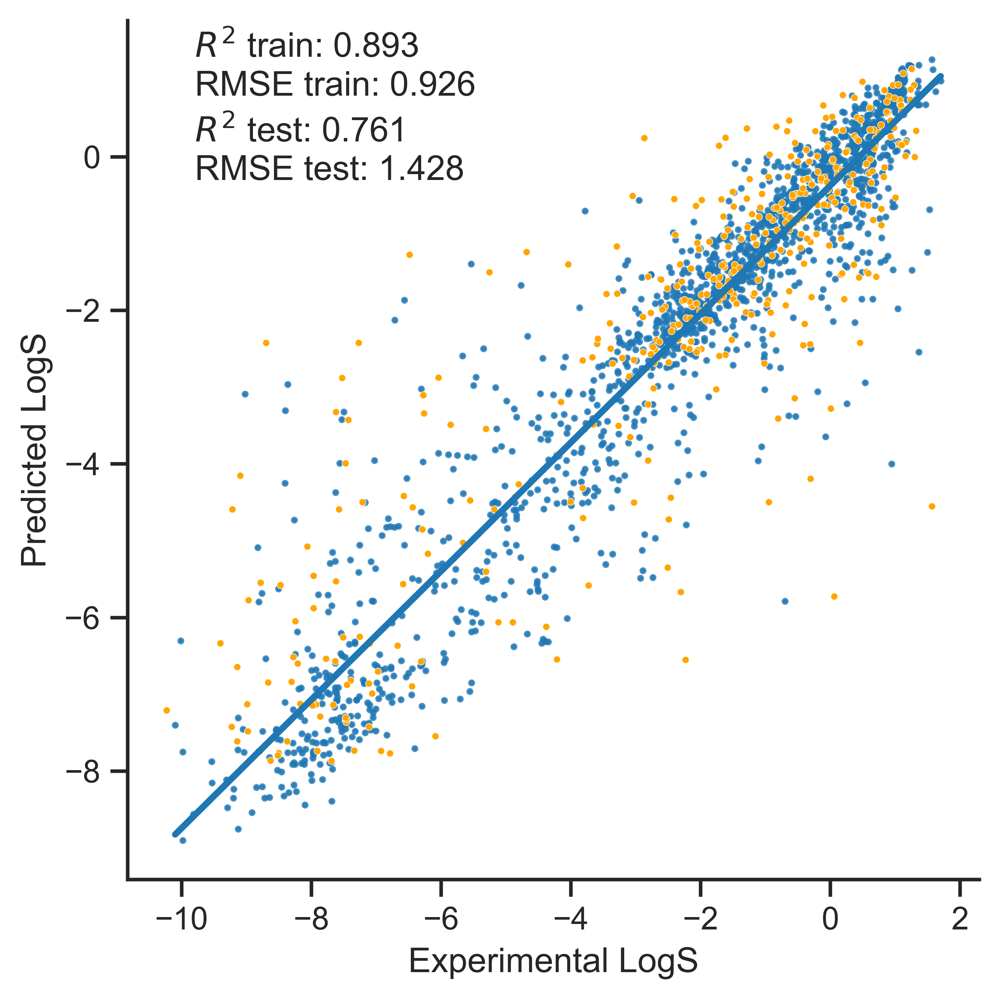

In [84]:

plt.rcParams['figure.figsize']=(5,5)
pred_true = pd.DataFrame({'True':y_train, 'Pred':y_train_pred})
sns.lmplot(data=pred_true, x='True', y='Pred', \
    scatter_kws={'s':2, 'color':'#1f77b4'}, ci=None)
sns.scatterplot(x=y_test, y = y_pred, c='orange', s=6)
#plt.ylim(-10,2)
#plt.xlim(-10,2)
plt.ylabel('Predicted LogS')
plt.xlabel('Experimental LogS')
plt.text(-9.8, 1.3, f'$R^{2}$ train: {r2_score(y_train, y_train_pred):.3f}', fontsize=12)
plt.text(-9.8, 0.8, f'RMSE train: {mean_squared_error(y_train, y_train_pred)**(1/2):.3f}', fontsize=12)
plt.text(-9.8, 0.2, f'$R^{2}$ test: {r2_score(y_test, y_pred):.3f}', fontsize=12)
plt.text(-9.8, -0.3, f'RMSE test: {mean_squared_error(y_test, y_pred)**(1/2):.3f}', fontsize=12)
plt.show()

Residual plot

Text(0.5, 0, 'LogS')

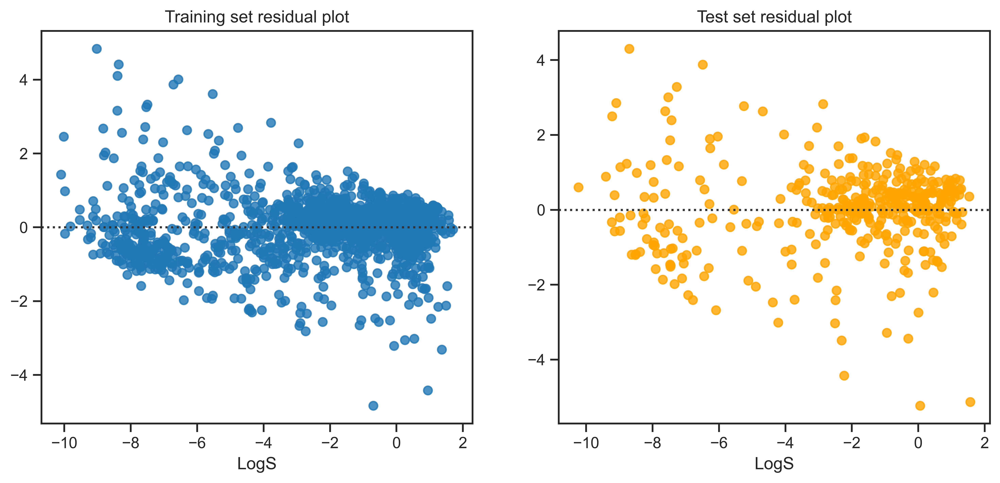

In [85]:
fig, axes = plt.subplots(nrows=1, ncols=2, figsize=(12, 5))
sns.residplot(x=y_train, y=y_train_pred, ax=axes[0])
axes[0].set_title('Training set residual plot')
axes[0].set_xlabel('LogS')
sns.residplot(x=y_test, y=y_pred, ax=axes[1], color='orange')
axes[1].set_title('Test set residual plot')
axes[1].set_xlabel('LogS')

## Feature importance

RF can also extract feature importance

In [91]:
# Importances will extract the feature importances from the best RF estimator
importances = rf.best_estimator_.feature_importances_
df_importances = pd.DataFrame({'Feature name':X_clean.columns, 'Importance': importances})
df_importances = df_importances.sort_values(by='Importance', ascending=True)

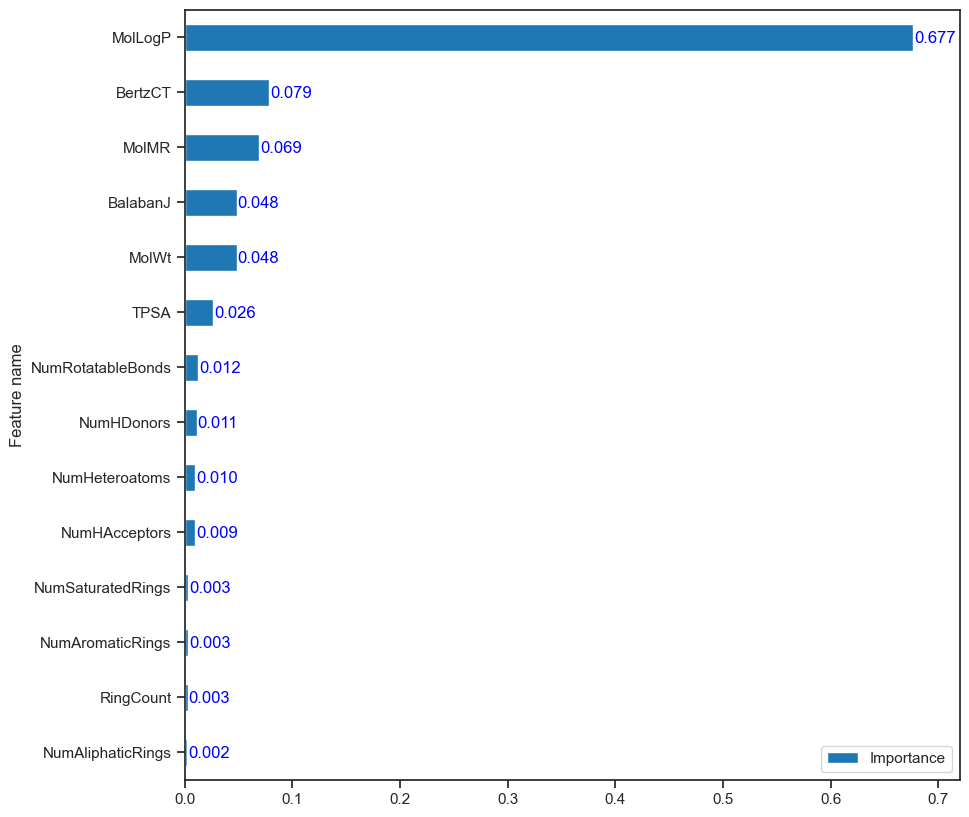

In [104]:
plt.rcParams["figure.figsize"] = (5,10)
plt.rcParams["font.size"] = 12
df_importances.plot.barh( x='Feature name', y = 'Importance')
for i, v in enumerate(df_importances['Importance']):
    plt.text(v + 0.001, i-0.1 , f'{v:.3f}', 
            color = 'blue')
plt.xlim(0, 0.72)
plt.legend(loc='lower right')


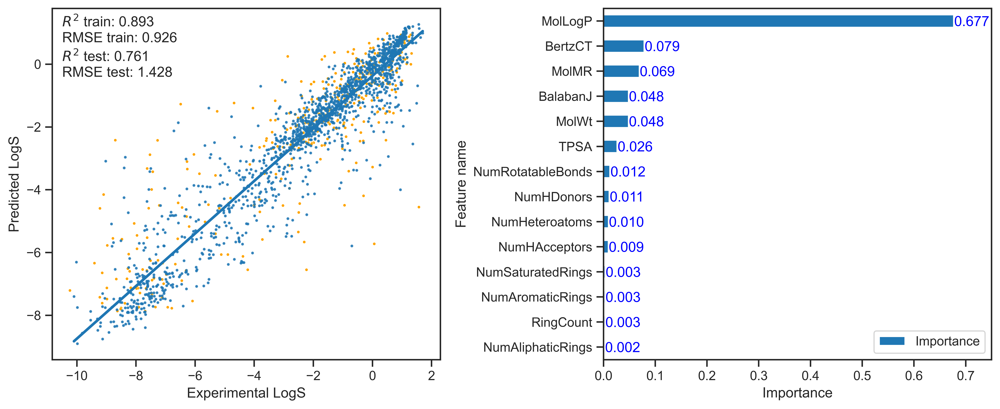

In [165]:
fig, axes = plt.subplots(nrows=1, ncols=2, figsize=(12, 5))

# Scatter plot subplot
ax0 = axes[0]
train_pred_true = pd.DataFrame({'True': y_train, 'Pred': y_train_pred})
sns.scatterplot(x=y_test, y=y_pred, ax=ax0, c='orange', s=6)
sns.regplot(data=train_pred_true, x='True', y='Pred', \
    scatter_kws={'s':2, 'color':'#1f77b4'}, ci=None, ax = ax0)
ax0.set_ylabel('Predicted LogS')
ax0.set_xlabel('Experimental LogS')
ax0.text(-10.5, 1.2, f'$R^2$ train: {r2_score(y_train, y_train_pred):.3f}', fontsize=12)
ax0.text(-10.5, 0.7, f'RMSE train: {mean_squared_error(y_train, y_train_pred)**(1/2):.3f}', fontsize=12)
ax0.text(-10.5, 0.1, f'$R^2$ test: {r2_score(y_test, y_pred):.3f}', fontsize=12)
ax0.text(-10.5, -0.4, f'RMSE test: {mean_squared_error(y_test, y_pred)**(1/2):.3f}', fontsize=12)

# Feature Importance subplot
ax1 = axes[1]
df_importances.plot.barh(x='Feature name', y='Importance', ax=ax1)
for i, v in enumerate(df_importances['Importance']):
    ax1.text(v + 0.001, i - 0.2, f'{v:.3f}', color='blue')
ax1.set_xlim(0, 0.75)
ax1.set_xlabel('Importance')
ax1.legend(loc='lower right')

# Adjust layout
plt.tight_layout()

# Show the plot
plt.show()


# Conformal predictor

Effort to incorperate conformal prediction

Thinking of training a RF model for both last outcome and error

First I will further split X_training and y_train to proper training set and calibration set.

In [20]:
X_train_cal = X_train.copy()
plt.rcParams["figure.figsize"] = (5,5)

Train the **target regressor** on the training set and predict on the calibration set

Define a function for conducting conformal predictor at different significant levels.

In [27]:
def ConformalPredictor(X_train_cal, y_train, X_test, y_test, sig):
    random_states = np.arange(0, 100, 1)
    confidence_level = (1 - sig) * 100
    target_df = pd.DataFrame()
    error_df = pd.DataFrame()

    for iterate in tqdm(random_states):
        X_train2, X_cal, y_train2, y_cal = train_test_split(X_train_cal, y_train, train_size=0.7, random_state=iterate)
        ## This part for target outcome predictor
        target_reg = RandomForestRegressor(random_state=42, n_jobs=-2)
        target_reg.fit(X_train2, y_train2)
        y_train2_pred = target_reg.predict(X_train2)
        train2_error = np.absolute(y_train2 - y_train2_pred)
        y_test_pred = target_reg.predict(X_test) # This is the predicted LogS of test set

        ## This part for error predictor
        y_cal_pred = target_reg.predict(X_cal)
        cal_error = np.absolute(y_cal - y_cal_pred)
        error_reg = RandomForestRegressor(random_state=42, n_jobs=-2)
        error_reg.fit(X_train2, train2_error)
        muy = error_reg.predict(X_cal)
        alphas = cal_error/muy
        alpha_sorted = alphas.sort_values().values
        alpha_conf = alpha_sorted[int((1 - sig) * len(alpha_sorted)) - 1]
        y_test_error_pred = error_reg.predict(X_test) # This is the predicted LogS of test set

        ## Calculate uncertainty by multiply alpha_conf with y_test_error_pred
        y_test_sd = alpha_conf * y_test_error_pred

        ## Store one iteration to a dataframe so that we can calculate the median prediction later
        target_df[iterate] = y_test_pred
        error_df[iterate] = y_test_sd

    target_median = target_df.median(axis=1)
    error_median = error_df.median(axis=1)
    evaluate_df = pd.DataFrame({
            'True value': y_test.values,
            'Predicted mean': target_median,
            'Predicted sd': np.absolute(error_median),
        })
    evaluate_df['Min'] = evaluate_df['Predicted mean'] - evaluate_df['Predicted sd']
    evaluate_df['Max'] = evaluate_df['Predicted mean'] + evaluate_df['Predicted sd']
    evaluate_df['Inside'] = (((evaluate_df['Min'] <= evaluate_df['True value']) & (evaluate_df['True value'] <= evaluate_df['Max'])))
    fig, ax = plt.subplots()

    # Plot y=x line
    x_line = np.linspace(evaluate_df['True value'].min(), evaluate_df['True value'].max(), 100)
    ax.plot(x_line, x_line, linestyle='--', color='gray')

    ax.errorbar(x=y_test, y=target_median, yerr=np.absolute(error_median), fmt="none", 
                alpha=0.3, ecolor='black', elinewidth=0.5)
    sns.scatterplot(data=evaluate_df, x='True value', y='Predicted mean', s=5, marker = 's', 
                    hue='Inside', hue_order=[True, False], ax=ax)
    #sns.regplot(data=evaluate_df, x='True value', y='Predicted mean', scatter=False, ax=ax)
    plt.xlabel('Experimental logS')
    plt.ylabel('Predicted median logS')

    accuracy = (evaluate_df['Inside'] == True).sum() / len(evaluate_df) * 100
    plt.legend(title='Captured')
    ax.set_xlim([-12,2])
    ax.set_ylim([-12,2])
    plt.text(plt.xlim()[1]-6.7, plt.ylim()[0]+1, f'Confidence level: {confidence_level:.1f}%', fontsize=12, ha='left')
    plt.text(plt.xlim()[1]-6.7, plt.ylim()[0]+0.35, f'Accuracy: {accuracy:.1f}%', fontsize=12, ha='left')
    plt.show()
    

100%|██████████| 100/100 [01:31<00:00,  1.10it/s]


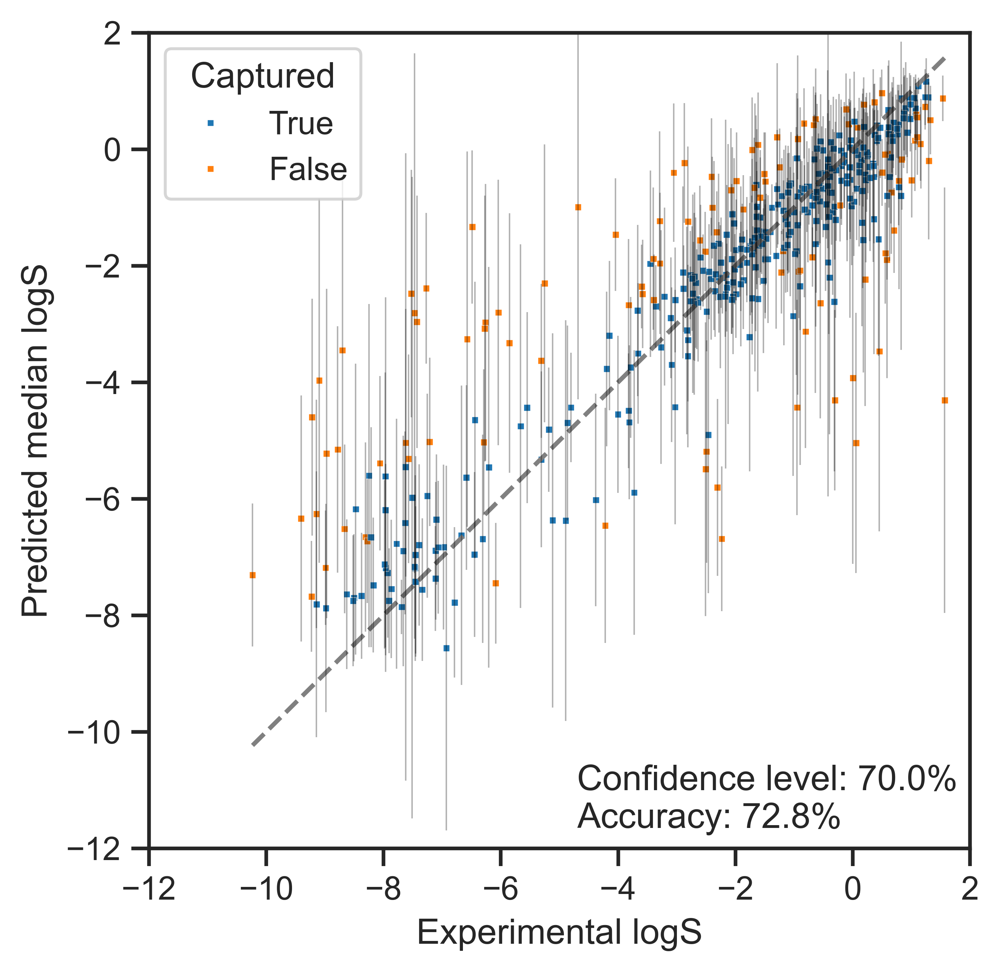

100%|██████████| 100/100 [01:44<00:00,  1.05s/it]


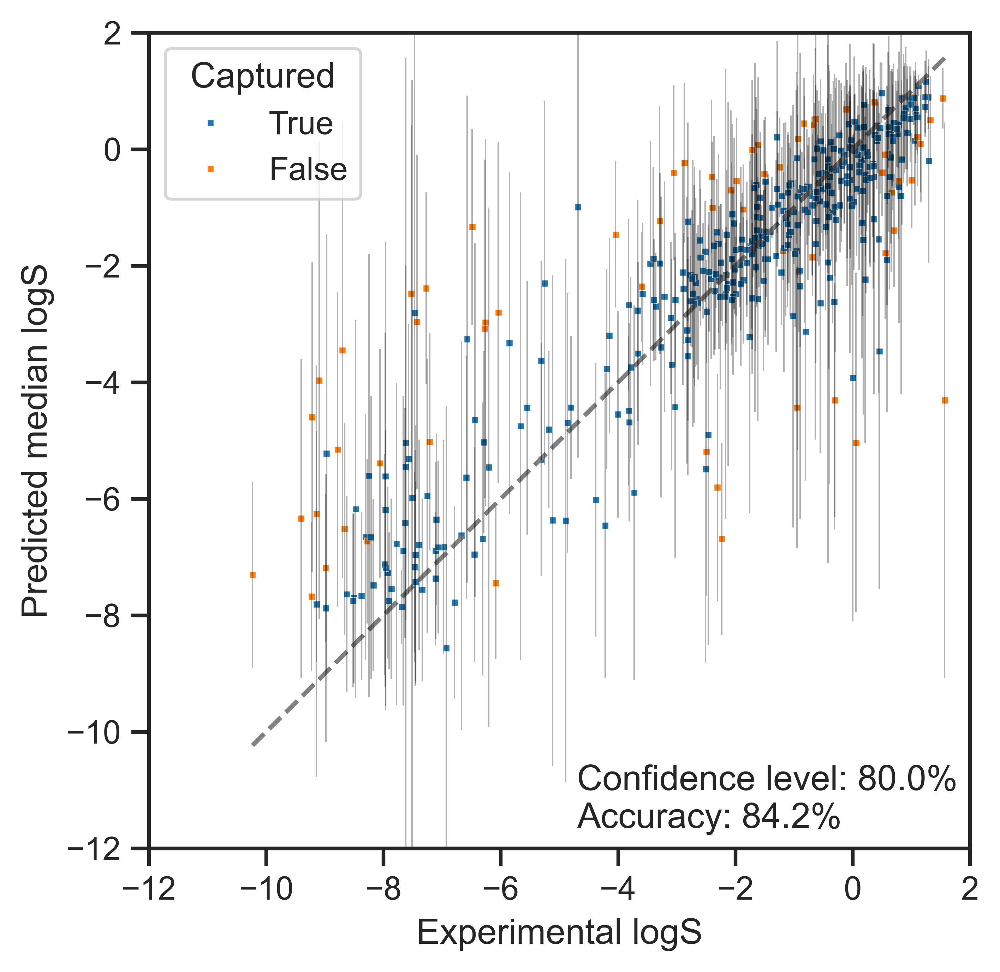

100%|██████████| 100/100 [01:35<00:00,  1.04it/s]


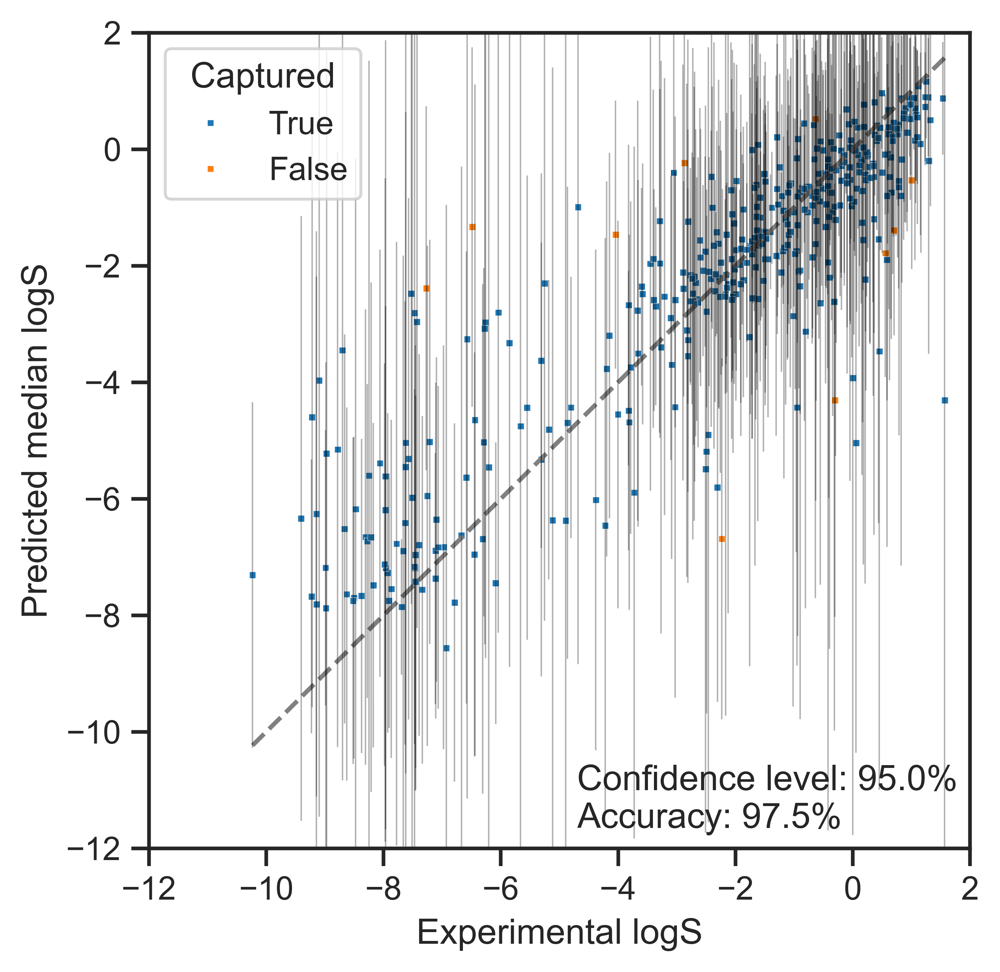

In [28]:
for sig in (0.3, 0.2, 0.05):
    ConformalPredictor(X_train_cal, y_train, X_test, y_test, sig=sig)